<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-Detectron2/blob/main/Chapter08/Detectron2_Chapter08_Augmentations_AugInput.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chapter 08 - Augmentations and AugInput

## Download sample images

In [ ]:
!python --version

In [ ]:
import torch
torch.__version__

In [ ]:
!wget --quiet https://github.com/PacktPublishing/Hands-On-Computer-Vision-with-Detectron2/raw/main/datasets/Chapter08.zip
!unzip --q Chapter08.zip

Archive:  Chapter08.zip
  inflating: Chapter08/1.jpg         
  inflating: Chapter08/2.jpg         
  inflating: Chapter08/3.jpg         
  inflating: Chapter08/4.jpg         


In [ ]:
!python -m  pip install --q \
'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 KB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 37.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 13.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.4/182.4 KB 19.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from detectron2.utils.visualizer import Visualizer

def imshow(image):
  dpi = plt.rcParams["figure.dpi"]
  im_data = image[:,:, ::-1]
  height, width, depth = im_data.shape
  figsize = width / float(dpi), height / float(dpi)
  fig = plt.figure(figsize=figsize)
  plt.imshow(im_data)
  plt.imshow(im_data)
  plt.axis("off")
  plt.show()

def visualize_image_boxes(img, boxes, colors=['k']):
  v = Visualizer(img, metadata={})
  v = v.overlay_instances(
      boxes           = boxes, 
      assigned_colors = colors*len(boxes)
      )
  im_data = v.get_image()
  imshow(im_data)
  
def visualize_sample(sample):
  img = sample['image'].to("cpu").numpy()
  img = np.moveaxis(img, 0, -1)
  boxes = sample['instances'].get('gt_boxes')
  visualize_image_boxes(img, boxes)

In [ ]:
import detectron2.data.transforms as T

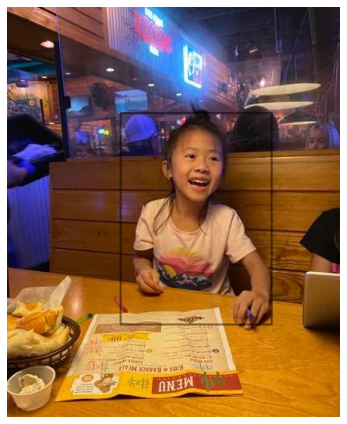

In [ ]:
# data
img = cv2.imread("Chapter08/1.jpg")
boxes = np.array([[150, 140, 350, 420]])
visualize_image_boxes(img, boxes = boxes)

## FixedSizeCrop

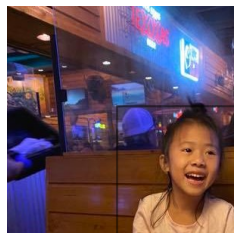

In [ ]:
cs = (300, 300)
fsc_aug = T.FixedSizeCrop(crop_size = cs, pad=True, pad_value=128)
fsc_tfm = fsc_aug.get_transform(img)
fsc_img = fsc_tfm.apply_image(img)
fsc_boxes = fsc_tfm.apply_box(boxes)
visualize_image_boxes(fsc_img, fsc_boxes)

## RandomApply

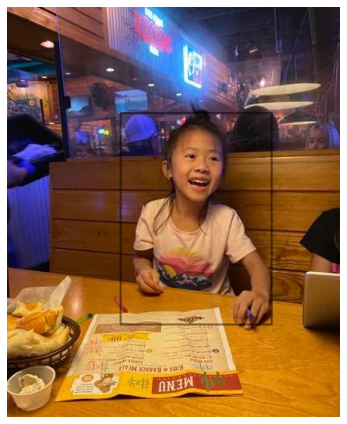

In [ ]:
ra_aug = T.RandomApply(fsc_tfm, prob = 0.3)
ra_fsc_tfm = ra_aug.get_transform()
ra_fsc_img = ra_fsc_tfm.apply_image(img)
ra_fsc_boxes = ra_fsc_tfm.apply_box(boxes)
visualize_image_boxes(ra_fsc_img, ra_fsc_boxes)

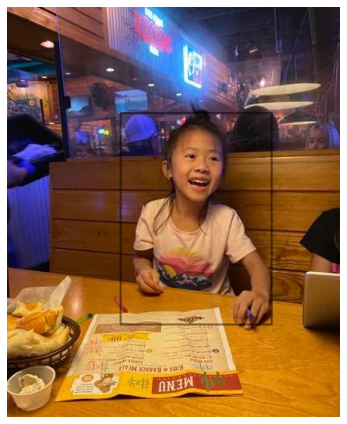

In [ ]:
ra_fsc_img = ra_fsc_tfm.apply_image(img)
ra_fsc_boxes = ra_fsc_tfm.apply_box(boxes)
visualize_image_boxes(ra_fsc_img, ra_fsc_boxes)

## RandomCrop

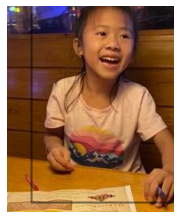

In [ ]:
rc_aug = T.RandomCrop(
    crop_type = "relative", 
    crop_size = (0.5, 0.5))
rc_tfm = rc_aug.get_transform(img)
rc_img = rc_tfm.apply_image(img)
rc_boxes = rc_tfm.apply_box(boxes)
visualize_image_boxes(rc_img, rc_boxes)

## RandomExtent

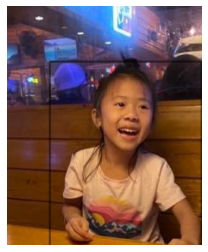

In [ ]:
re_aug = T.RandomExtent(
    scale_range = (0.5, 0.9), 
    shift_range = (0.3, 0.3))
re_tfm = re_aug.get_transform(img)
re_img = re_tfm.apply_image(img)
re_boxes = re_tfm.apply_box(boxes)
visualize_image_boxes(re_img, re_boxes)

## RandomFlip

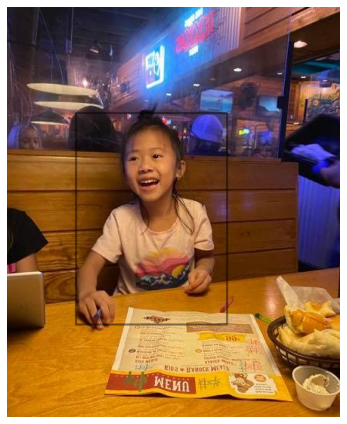

In [ ]:
rf_aug = T.RandomFlip(prob        = 0.5,
                      horizontal  = True,
                      vertical    = False)
rf_tfm = rf_aug.get_transform(img)
rf_img = rf_tfm.apply_image(img)
rf_boxes = rf_tfm.apply_box(boxes)
visualize_image_boxes(rf_img, rf_boxes)

## RandomRotation

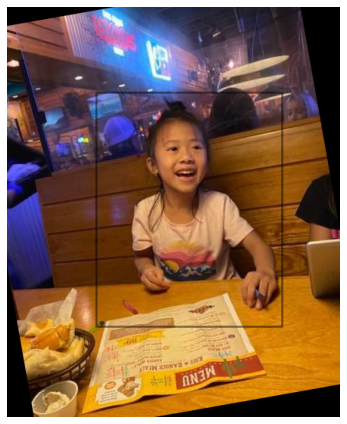

In [ ]:
rr_aug = T.RandomRotation(
    angle         = [-30, 30],
    sample_style  = "range",
    center        = [[0.4, 0.6], [0.4, 0.6]],
    expand        = False
    )
rr_tfm = rr_aug.get_transform(img)
rr_img = rr_tfm.apply_image(img)
rr_boxes = rr_tfm.apply_box(boxes)
visualize_image_boxes(rr_img, rr_boxes)

## Resize

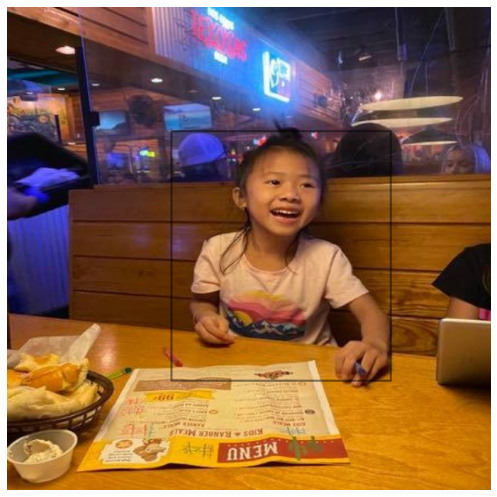

In [ ]:
rs_aug = T.Resize(
    shape=(640, 640)
)
rs_tfm = rs_aug.get_transform(img)
rs_img = rs_tfm.apply_image(img)
rs_boxes = rs_tfm.apply_box(boxes)
visualize_image_boxes(rs_img, rs_boxes)

## RandomResize

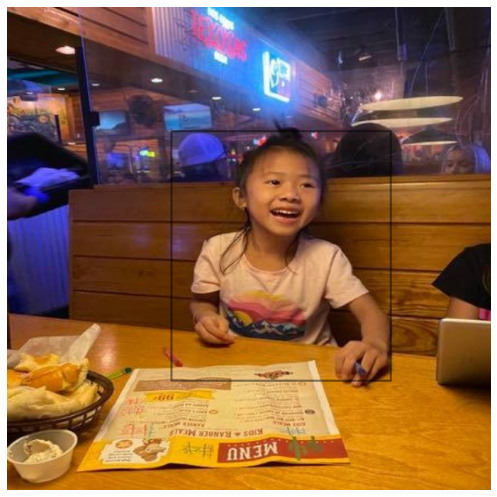

In [ ]:
rrs_aug = T.RandomResize(
    shape_list=[(320, 320), (640, 640)]
)
rrs_tfm = rrs_aug.get_transform(img)
rrs_img = rrs_tfm.apply_image(img)
rrs_boxes = rrs_tfm.apply_box(boxes)
visualize_image_boxes(rrs_img, rrs_boxes)

## ResizeScale

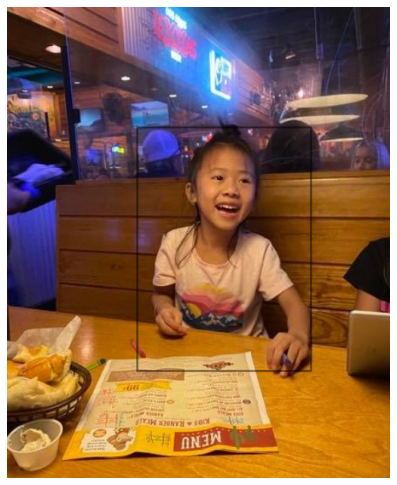

In [ ]:
rss_aug = T.ResizeScale(
    min_scale     = 0.5,
    max_scale     = 1.0,
    target_height = 640,
    target_width  = 640
    )
rss_tfm = rss_aug.get_transform(img)
rss_img = rss_tfm.apply_image(img)
rss_boxes = rss_tfm.apply_box(boxes)
visualize_image_boxes(rss_img, rss_boxes)

## ResizeShortestEdge

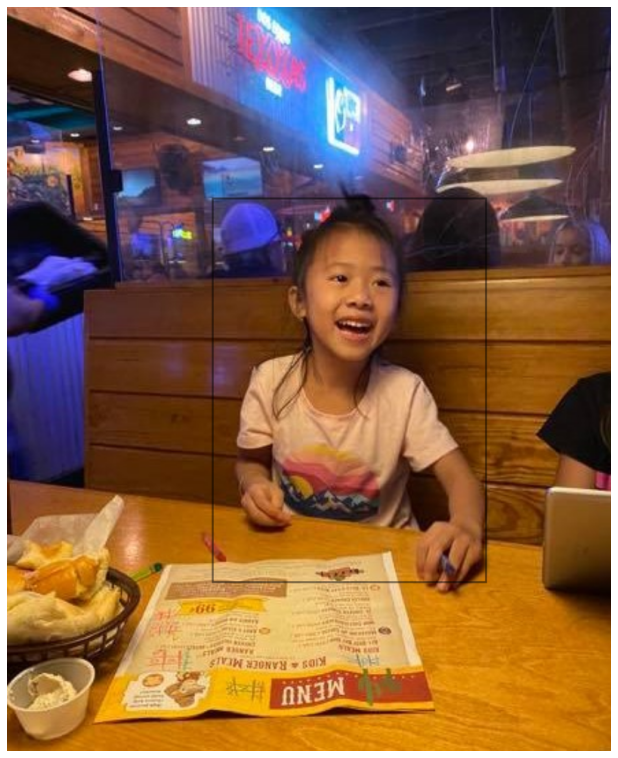

In [ ]:
rse_aug = T.ResizeShortestEdge(
    short_edge_length=(640, 672, 704, 736, 768, 800), 
    max_size=1333, 
    sample_style='choice')
rse_tfm = rse_aug.get_transform(img)
rse_img = rse_tfm.apply_image(img)
rse_boxes = rse_tfm.apply_box(boxes)
visualize_image_boxes(rse_img, rse_boxes)

## RandomCrop_CategoryAreaConstraint


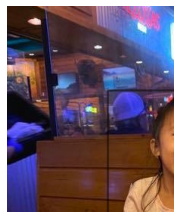

In [ ]:
cac_aug = T.RandomCrop_CategoryAreaConstraint(
    crop_type                 = "relative", 
    crop_size                 = (0.5, 0.5),
    single_category_max_area  = 0.5,
    ignored_category          = None
    )
sem_seg = np.zeros(img.shape[:2])
cac_tfm = cac_aug.get_transform(img, sem_seg=sem_seg)
cac_img = cac_tfm.apply_image(img)
cac_boxes = cac_tfm.apply_box(boxes)
visualize_image_boxes(cac_img, cac_boxes)

## MinIoURandomCrop 

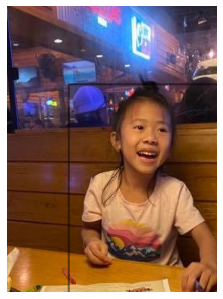

In [ ]:
iou_aug = T.MinIoURandomCrop(
    min_ious      = [0.5, 0.6, 0.7],
    min_crop_size = 0.5,
    mode_trials   = 1000,
    crop_trials   = 50
    )
iou_tfm = iou_aug.get_transform(img, boxes=boxes)
iou_img = iou_tfm.apply_image(img)
iou_boxes = iou_tfm.apply_box(boxes)
visualize_image_boxes(iou_img, iou_boxes)

# RandomBrightness 

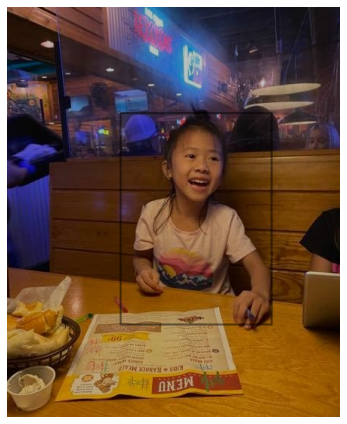

In [ ]:
rb_aug = T.RandomBrightness(
    intensity_min = 0.5,
    intensity_max = 1.5
    )
rb_tfm = rb_aug.get_transform(img)
rb_img = rb_tfm.apply_image(img)
visualize_image_boxes(rb_img, boxes)

## RandomContrast

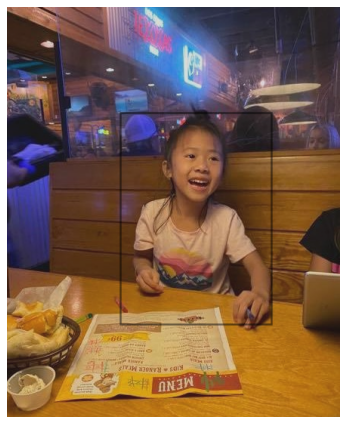

In [ ]:
rc_aug = T.RandomContrast(
    intensity_min = 0.5,
    intensity_max = 1.5
    )
rc_tfm = rc_aug.get_transform(img)
rc_img = rc_tfm.apply_image(img)
visualize_image_boxes(rc_img, boxes)

## RandomSaturation

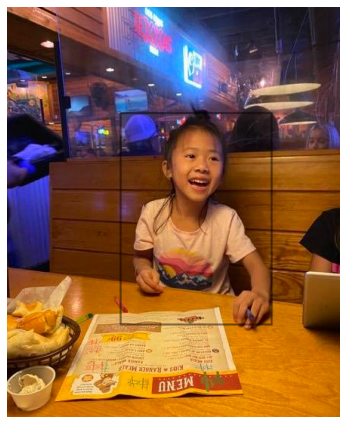

In [ ]:
rs_aug = T.RandomSaturation(
    intensity_min = 0.5,
    intensity_max = 1.5
    )
rs_tfm = rs_aug.get_transform(img[:,:,::-1])
rs_img = rs_tfm.apply_image(img[:,:,::-1])[:,:,::-1]
visualize_image_boxes(rs_img, boxes)

## RandomLighting

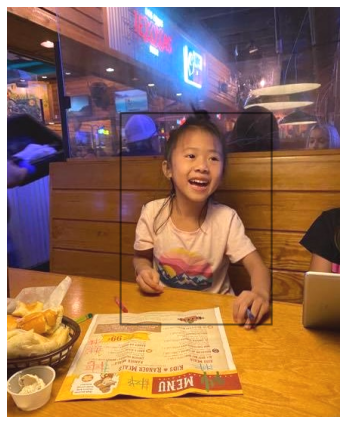

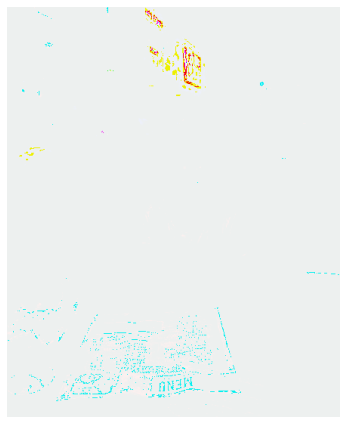

In [ ]:
rl_aug = T.RandomLighting(scale = 255)
rl_tfm = rl_aug.get_transform(img[:,:,::-1])
rl_img = rl_tfm.apply_image(img[:, :, ::-1])
visualize_image_boxes(rl_img[:, :, ::-1], boxes)
imshow(img-rl_img[:,:,::-1])

## AugmentationList and AugInput

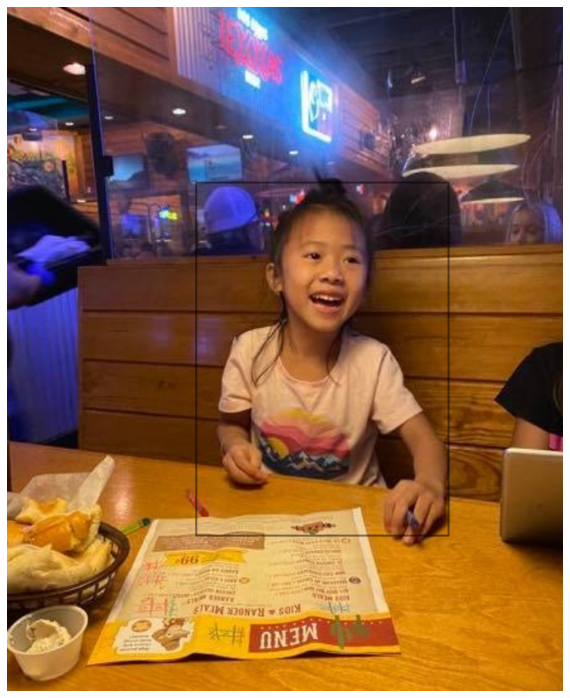

In [ ]:
# AugmentationList
rse_aug = T.ResizeShortestEdge(
    short_edge_length = (640, 672, 704, 736, 768, 800), 
    max_size          = 1330, 
    sample_style      = 'choice')
rf_aug = T.RandomFlip(
    prob        = 0.5, 
    horizontal  = True,
    vertical    = False)
augs = [rse_aug, rf_aug]
augmentation = T.AugmentationList(augs)
# AugInput
input = T.AugInput(img, boxes=boxes)
# Transformation
tfms = augmentation(input)
tfm_img = input.image
tfm_boxes = input.boxes
visualize_image_boxes(tfm_img, tfm_boxes)

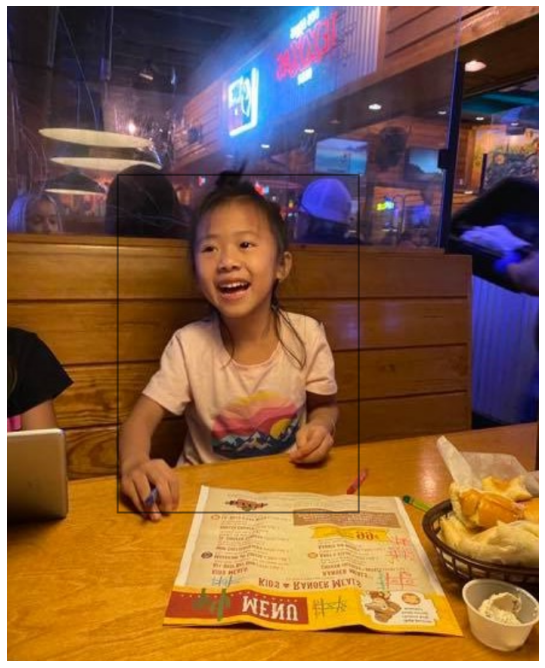

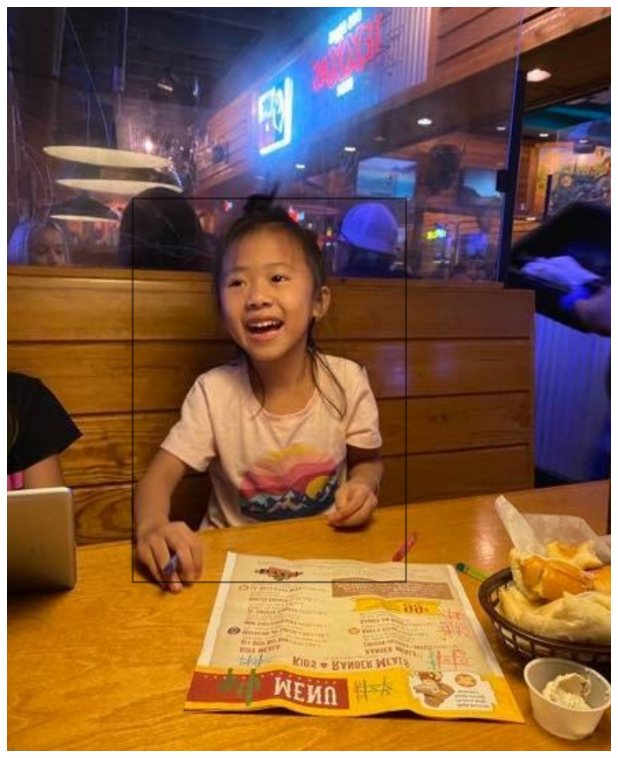

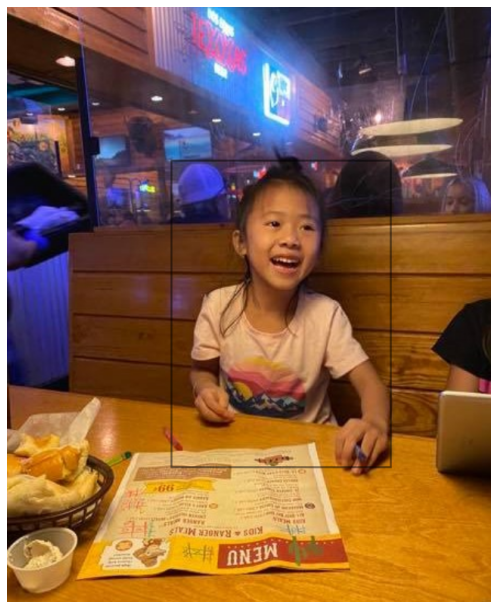

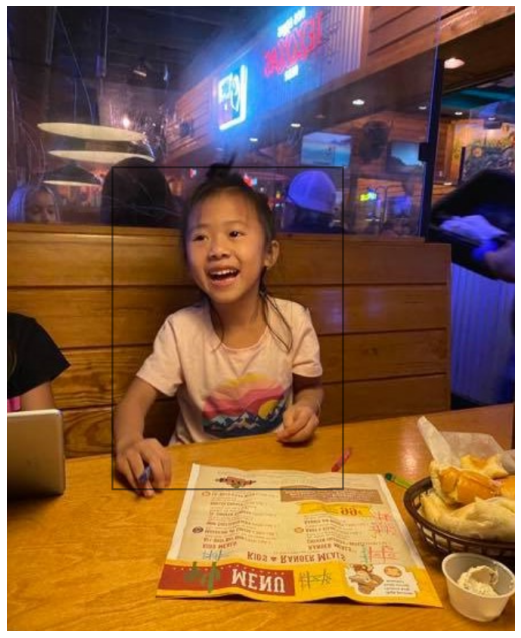

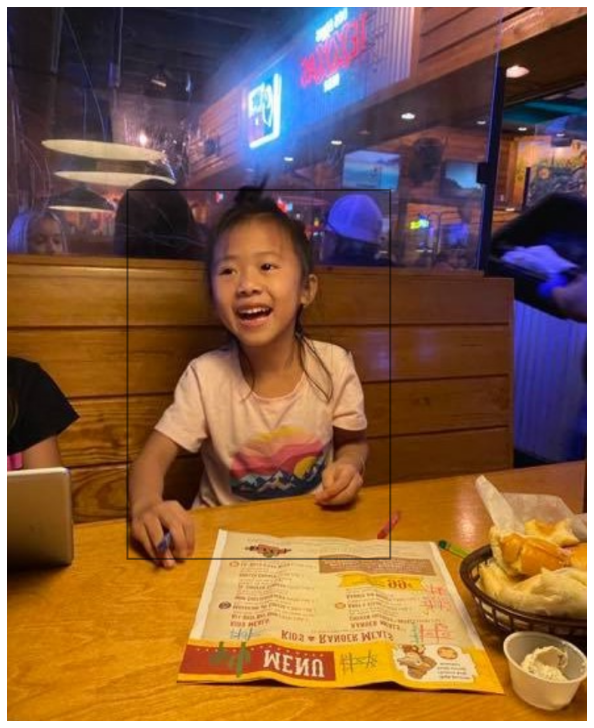

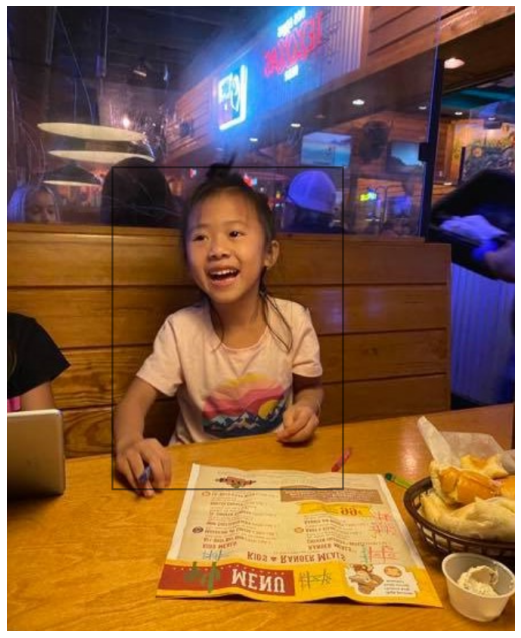

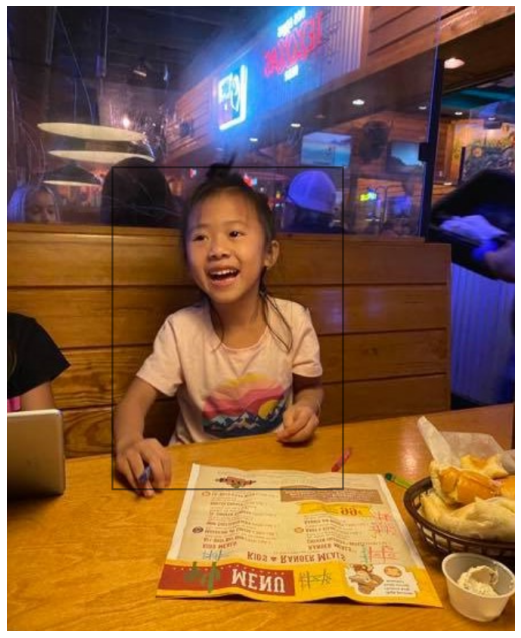

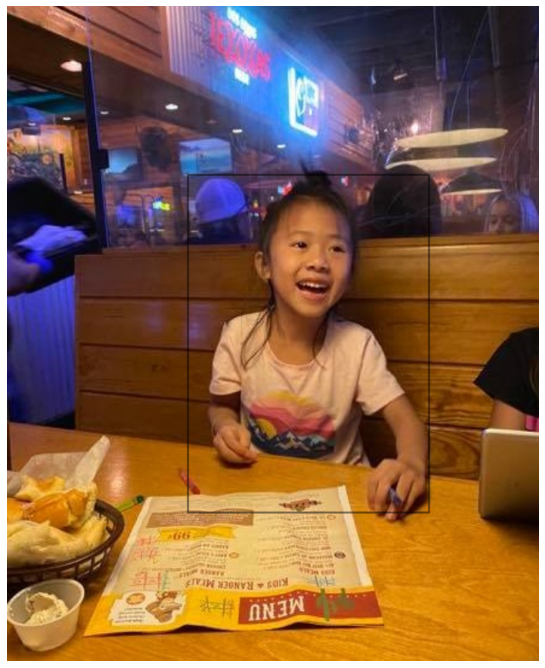

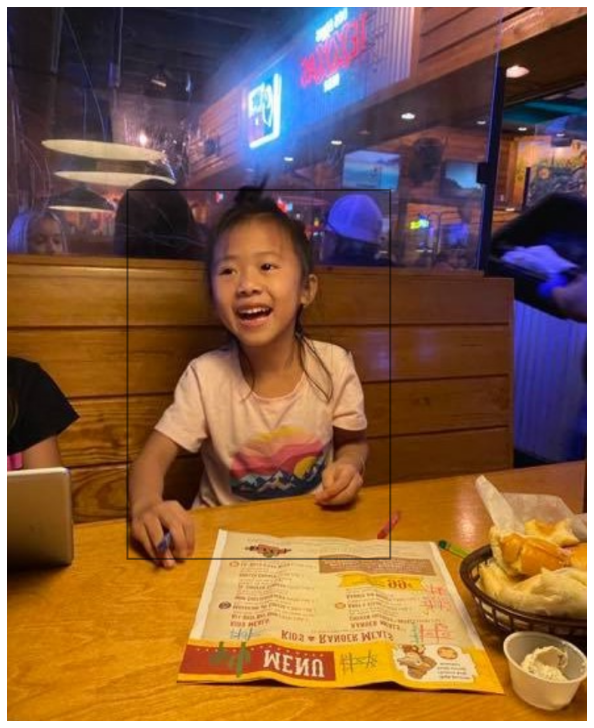

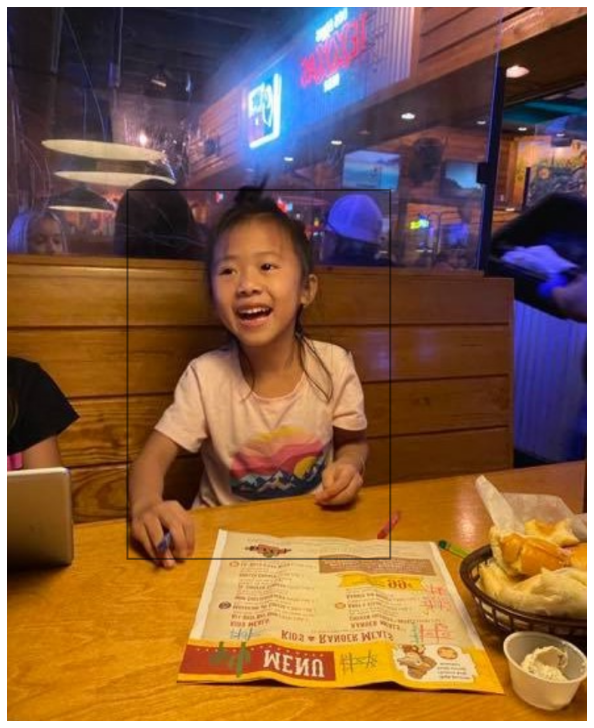

In [ ]:
for i in range(10):
  # AugInput
  input = T.AugInput(img, boxes=boxes)
  # Transformation
  tfms = augmentation(input)
  tfm_img = input.image
  tfm_boxes = input.boxes
  visualize_image_boxes(tfm_img, tfm_boxes)